In [94]:
from nltk.corpus import stopwords
from pymongo import MongoClient
import gensim
import nltk
nltk.download('stopwords')
import string
import tqdm

DEBUG = False
EXCLUDE_SITES = set(['www.ft.com'])

class DataPipeline:
    def __init__(self):
        self.postprocessors = []

    def transform(self, data, DEBUG=False):
        for pp in self.postprocessors:
            processor, _ = pp
            try:
                data = processor.transform(data, DEBUG=DEBUG)
            except AbortException as e:
                print('dropping example because of {}'.format(e))
                return None
        return data

    def register_postprocessor(self, postprocessor, order):
        if not self.postprocessors:
            self.postprocessors = [(postprocessor, order)]
        else:
            # insert postprocessors according to order
            insert_idx = 0
            while insert_idx < len(self.postprocessors) and order > self.postprocessors[insert_idx][1]:
                insert_idx += 1

            self.postprocessors.insert(insert_idx, (postprocessor, order))

class PostProcessor(object):
    def __init__(self, name, *args, **kwargs):
        self.name = name

    def transform(self, inputs):
        # input is list of words/sentences
        # output modified list
        pass

    def log(self, msg):
        print('[{}] {}'.format(self.name.upper(), msg))

# Processors: these could be simple functions, if processing function is stateless, too
class AbortException(Exception):
    pass

class ExcludeSiteProcessor(PostProcessor):
    def __init__(self, name, exclude_sites):
        PostProcessor.__init__(self, name)
        self.exclude_sites = exclude_sites
        
    def transform(self, doc, DEBUG=False):
        if doc['href'] in self.exclude_sites:
            raise AbortException
            
class StripProcessor(PostProcessor):
    def __init__(self, name):
        PostProcessor.__init__(self, name)
    
    def transform(self, doc, DEBUG=False):
        doc = [_doc.strip() for _doc in doc]
        return doc
        
class SkipProcessor(PostProcessor):
    def __init__(self, name, skip_criteria):
        PostProcessor.__init__(self, name)
        self.skip_criteria = skip_criteria
        self.num_skips = 0

    def transform(self, doc, DEBUG=False):
        if self.skip_criteria(doc):
            self.num_skips += 1
            raise AbortException('skip criteria is met')
        if DEBUG:
            self.log(doc)
        return doc
    
class SplitProcessor(PostProcessor):
    def __init__(self, name, split_type='sentence'):
        PostProcessor.__init__(self, name)
        self.split_way = split_type

    def transform(self, words_lists, DEBUG=False):
        # Params:
        #   wordLists: list of words, could be sentence or paragraphs.
        #   split_way: word, sentence, or paragraphs
        assert self.split_way in ['word', 'sentence', 'paragraph']

        if self.split_way == 'paragraph':
            # split by sentence
            raise NotImplemented('paragraph splitting not implemented yet.') 

        splits = []

        if self.split_way == 'sentence':
            # split by sentence
            delimiter = '.'
            for wl in words_lists:
                splits += wl.split(delimiter)
        else:
            # split by word
            delimiter = ' '
            for wl in words_lists:
                splits += wl.split(delimiter)

        if DEBUG:
            self.log(splits)
        return splits

class StopWordProcessor(PostProcessor):
    def __init__(self, name, lang='english'):
        PostProcessor.__init__(self, name)
        punctuations = string.punctuation+'—”\'\’'

        # get english stopwords
        self.stopws = set(stopwords.words(lang))
        # replace punctuations with whitespaces
        self.translator = str.maketrans(punctuations, ' '*len(punctuations))
    
    def transform(self, words_lists, DEBUG=False):
        # Params:
        #   wordLists: list of words, could be sentence or paragraphs.
        tokens_lists = []
        for wl in words_lists:
            # get rid of punctuations
            filtered_wl = wl.translate(self.translator).split()
            # get rid of stop words
            tokens = [token.lower() for token in filtered_wl if token.lower() not in self.stopws]
            tokens_lists += tokens
        
        if DEBUG:
            self.log(tokens_lists)
        return tokens_lists

class GenSimProcessor(PostProcessor):
    def __Init__(self, name):
        PostProcessor.__init__(self, name)
    
    def transform(self, pgraphs, DEBUG=False):
        tokens_list = []
        for pgraph in pgraphs:
            tokens = gensim.utils.simple_preprocess(pgraph)
            
            if tokens:
                tokens_list.append(tokens)
        if DEBUG:
            self.log(tokens_list)
        return tokens_list
    
class WordCountLimitProcessor(PostProcessor):
    def __init__(self, name, word_count_lb):
        PostProcessor.__init__(self, name)
        self.word_count_thres = word_count_lb
        self.num_drops = 0

    def transform(self, word_list, DEBUG=False):
        if len(word_list) < self.word_count_thres:
            self.num_drops += 1
            raise AbortException('word count threshold is not met')
        if DEBUG:
            self.log(word_list)
        return word_list

class FlattenProcessor(PostProcessor):
    def __init__(self, name):
        PostProcessor.__init__(self, name) 

    def transform(self, word_lists, DEBUG=False):
        return [word for word_list in word_lists for word in word_list]



title_pipeline = DataPipeline()
title_pipeline.register_postprocessor(SkipProcessor('title_skip_processor', lambda x: any(map(lambda y: 'Are you a robot' in y, x))), 0)
# title_pipeline.register_postprocessor(StripProcessor('title_strip_processor'), 20)
# title_pipeline.register_postprocessor(SplitProcessor('title_split_processor', split_type='word'), 30)
# title_pipeline.register_postprocessor(StopWordProcessor('title_stop_processor'), 40)
title_pipeline.register_postprocessor(GenSimProcessor('title_gensim_processor'), 30)
title_pipeline.register_postprocessor(FlattenProcessor('title_flatten_processor'), 60)
title_pipeline.register_postprocessor(WordCountLimitProcessor('title_word_limit_processor', 3), 70)

pgraph_pipeline = DataPipeline()
pgraph_pipeline.register_postprocessor(SkipProcessor('pgraph_skip_processor', lambda x: any(map(lambda y: 'We’ve detected that JavaScript' in y or 'Then $69 per month' in y, x))), 0)
# pgraph_pipeline.register_postprocessor(StripProcessor('pgraph_strip_processor'), 5)
# pgraph_pipeline.register_postprocessor(SplitProcessor('pgraph_split_processor', split_type='word'), 10)
# pgraph_pipeline.register_postprocessor(StopWordProcessor('pgraph_stop_processor'), 20)
pgraph_pipeline.register_postprocessor(GenSimProcessor('pgraph_gensim_processor'), 30)
pgraph_pipeline.register_postprocessor(FlattenProcessor('pgraph_flatten_processor'), 60)
pgraph_pipeline.register_postprocessor(WordCountLimitProcessor('pgraph_word_limit_processor', 300), 70)

def transform_instance(doc, title_pipeline, pgraph_pipeline, DEBUG=False):
    titles = doc['title']
    if type(titles) is not list:
        titles = [titles] # make title to list to concatenate with subtitles
    subtitles = doc.get('subtitles', [])
    titles = titles + subtitles
    print('[INFO] transforming doc {}'.format(doc['href']))
    title_data = title_pipeline.transform(titles, DEBUG=DEBUG)
    
    pgraphs = doc.get('paragraphs', [])
    pgraph_data = pgraph_pipeline.transform(pgraphs, DEBUG=DEBUG)
    
    return title_data, pgraph_data

if __name__ == '__main__':
    # two training pipelines
    # 1. titles
    # 2. paragraphs
    client = MongoClient("localhost", 27017, maxPoolSize=50)
    db = client.hndb
    collection = db['mongo_sites_2']
    orig_docs = list(collection.find().sort('_id', 1))
    num_dropped = 0

    X = []
    to_keep = []
    for i, doc in tqdm.tqdm(enumerate(orig_docs)):
        if doc['href'][0] in EXCLUDE_SITES:
            continue
            
        title_data, pgraph_data = transform_instance(doc, title_pipeline, pgraph_pipeline, DEBUG=True)
        
        if title_data and pgraph_data:
            doc_data = title_data + pgraph_data
            X.append(doc_data)
            to_keep.append(i)
        else:
            num_dropped += 1

    docs = [orig_docs[i] for i in to_keep]
    print('number of documents dropped: ', num_dropped)

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/liweic/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
14it [00:00, 125.37it/s]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

95it [00:00, 262.23it/s]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

177it [00:00, 283.26it/s]


[PGRAPH_WORD_LIMIT_PROCESSOR] ['please', 'sign', 'in', 'to', 'use', 'codespaces', 'welcome', 'to', 'microfeed', 'lightweight', 'content', 'management', 'system', 'cms', 'self', 'hosted', 'on', 'cloudflare', 'with', 'microfeed', 'you', 'can', 'easily', 'publish', 'variety', 'of', 'content', 'such', 'as', 'audios', 'videos', 'photos', 'documents', 'blog', 'posts', 'and', 'external', 'urls', 'to', 'feed', 'in', 'the', 'form', 'of', 'web', 'rss', 'and', 'json', 'it', 'the', 'perfect', 'solution', 'for', 'tech', 'savvy', 'individuals', 'who', 'want', 'to', 'self', 'host', 'their', 'own', 'cms', 'without', 'having', 'to', 'run', 'their', 'own', 'servers', 'microfeed', 'is', 'built', 'by', 'listen', 'notes', 'and', 'is', 'hosted', 'on', 'cloudflare', 'pages', 'and', 'zero', 'trust', 'if', 'you', 'have', 'any', 'questions', 'or', 'feedback', 'please', 'don', 'hesitate', 'to', 'reach', 'out', 'to', 'us', 'at', 'support', 'microfeed', 'org', 'we', 'love', 'to', 'hear', 'from', 'you', 'since', '

231it [00:00, 240.81it/s]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

290it [00:01, 267.31it/s]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

350it [00:01, 254.74it/s]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=10000


[INFO] transforming doc ['https://en.wikipedia.org/wiki/Compute_Express_Link']
[TITLE_SKIP_PROCESSOR] ['Compute Express Link - Wikipedia', 'Contents', 'Navigation menu', '\n\t\t', '\n\t', '\n\t\t', '\n\t', '\n\t\t', '\n\t', '\n\t\t', '\n\t', '\n\t\t', '\n\t', '\n\t\t', '\n\t', '\n\t\t', '\n\t', '\n\t\t', '\n\t']
[TITLE_GENSIM_PROCESSOR] [['compute', 'express', 'link', 'wikipedia'], ['contents'], ['navigation', 'menu']]
[TITLE_WORD_LIMIT_PROCESSOR] ['compute', 'express', 'link', 'wikipedia', 'contents', 'navigation', 'menu']
[PGRAPH_SKIP_PROCESSOR] ['Compute Express Link (CXL) is an open standard for high-speed central processing unit (CPU)-to-device and CPU-to-memory connections, designed for high performance data center computers.[1][2][3][4] CXL is built on the PCI Express (PCIe) physical and electrical interface and includes PCIe-based block input/output protocol (CXL.io) and new cache-coherent protocols for accessing system memory (CXL.cache) and device memory (CXL.mem).\n', '\n',

864it [00:04, 171.87it/s]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

1705it [00:08, 287.85it/s]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

1841it [00:08, 376.51it/s]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=100


[PGRAPH_WORD_LIMIT_PROCESSOR] ['at', 'nile', 'we', 're', 'making', 'it', 'easier', 'for', 'companies', 'to', 'build', 'world', 'class', 'control', 'planes', 'for', 'their', 'infra', 'saas', 'products', 'multi', 'tenancy', 'is', 'core', 'to', 'all', 'saas', 'products', 'and', 'especially', 'those', 'with', 'control', 'plane', 'architectures', 'at', 'nile', 'we', 've', 'built', 'multi', 'tenancy', 'into', 'our', 'product', 'from', 'day', 'one', 'if', 'you', 'are', 'working', 'on', 'an', 'infra', 'saas', 'product', 'and', 'need', 'multi', 'tenant', 'control', 'plane', 'you', 'should', 'talk', 'to', 'us', 'from', 'previous', 'experience', 'we', 're', 'familiar', 'with', 'multiple', 'multi', 'tenant', 'saas', 'architecture', 'options', 'we', 'decided', 'to', 'store', 'everything', 'in', 'single', 'postgres', 'schema', 'since', 'it', 'provides', 'balance', 'of', 'scalability', 'cost', 'optimization', 'and', 'flexibility', 'however', 'this', 'requires', 'serious', 'investment', 'in', 'databa

2070it [00:09, 381.44it/s]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

2822it [00:12, 163.00it/s]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

2888it [00:12, 223.68it/s]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=10


[PGRAPH_WORD_LIMIT_PROCESSOR] ['the', 'boeing', 'superfortress', 'was', 'conceived', 'as', 'state', 'of', 'the', 'art', 'high', 'altitude', 'strategic', 'bomber', 'in', 'with', 'world', 'war', 'ii', 'on', 'the', 'horizon', 'the', 'united', 'states', 'army', 'air', 'corps', 'saw', 'the', 'need', 'for', 'bomber', 'that', 'could', 'carry', 'heavy', 'bomb', 'loads', 'over', 'the', 'vast', 'distances', 'of', 'the', 'pacific', 'it', 'was', 'the', 'threat', 'of', 'nazi', 'germany', 'however', 'that', 'spurred', 'the', 'development', 'of', 'the', 'new', 'superbomber', 'in', 'boeing', 'submitted', 'an', 'advanced', 'design', 'for', 'four', 'engine', 'bomber', 'with', 'pressurized', 'fuselage', 'which', 'the', 'air', 'corps', 'chose', 'for', 'production', 'as', 'the', 'the', 'program', 'would', 'become', 'the', 'most', 'expensive', 'of', 'the', 'war', 'outpacing', 'the', 'development', 'of', 'the', 'atomic', 'bomb', 'by', 'more', 'than', 'billion', 'dollars', 'delays', 'in', 'developing', 'the'

3396it [00:14, 289.79it/s]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

4327it [00:17, 247.70it/s]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

4393it [00:17, 240.71it/s]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=10


[PGRAPH_WORD_LIMIT_PROCESSOR] ['it', 'is', 'static', 'fast', 'seo', 'friendly', 'and', 'host', 'anywhere', 'includes', 'built', 'in', 'search', 'handles', 'code', 'blocks', 'and', 'other', 'formatting', 'correctly', 'once', 'you', 'upload', 'your', 'slack', 'dump', 'you', 'll', 'get', 'your', 'own', 'link', 'like', 'the', 'one', 'above', 'within', 'couple', 'of', 'minutes', 'there', 'are', 'currently', 'sites', 'in', 'the', 'processing', 'queue', 'what', 'is', 'this', 'for', 'lot', 'of', 'knowledge', 'is', 'locked', 'up', 'in', 'slack', 'communities', 'recently', 'slack', 'announced', 'pricing', 'change', 'which', 'meant', 'that', 'this', 'knowlege', 'would', 'all', 'disappear', 'after', 'months', 'change', 'effective', 'september', 'you', 'can', 'read', 'the', 'details', 'on', 'their', 'blog', 'in', 'order', 'to', 'free', 'this', 'knowledge', 'and', 'make', 'it', 'searchable', 'by', 'your', 'community', 'you', 'can', 'export', 'zip', 'file', 'of', 'all', 'public', 'slack', 'channels'

4526it [00:18, 166.81it/s]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

4552it [00:18, 170.82it/s]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

4630it [00:19, 175.72it/s]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=10


[PGRAPH_WORD_LIMIT_PROCESSOR] ['what', 'can', 'visual', 'art', 'teach', 'us', 'about', 'scent', 'stench', 'and', 'the', 'mysterious', 'substance', 'known', 'as', 'ambergris', 'lizzie', 'marx', 'follows', 'whale', 'trail', 'across', 'history', 'to', 'discover', 'the', 'olfactory', 'paradoxes', 'of', 'the', 'dutch', 'golden', 'age', 'published', 'july', 'during', 'the', 'seventeenth', 'century', 'whales', 'of', 'various', 'species', 'and', 'sizes', 'were', 'washed', 'up', 'on', 'the', 'shores', 'of', 'the', 'netherlands', 'sometimes', 'the', 'creatures', 'were', 'already', 'seized', 'by', 'decay', 'other', 'times', 'they', 'were', 'beached', 'alive', 'bellowing', 'deafening', 'groans', 'while', 'being', 'crushed', 'by', 'the', 'sheer', 'weight', 'of', 'their', 'own', 'bodies', 'while', 'they', 'decomposed', 'gases', 'would', 'build', 'up', 'sometimes', 'culminating', 'in', 'fetid', 'explosion', 'if', 'the', 'tide', 'did', 'not', 'sweep', 'away', 'the', 'whale', 'long', 'and', 'arduous',

 2021


In [95]:
# save docs to db
db['filtered_hn_sites'].drop()
collection = db['filtered_hn_sites']
collection.insert_many(docs)

In [96]:
import numpy as np
import pickle
from gensim.models import KeyedVectors
import itertools

In [97]:
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
from gensim.test.utils import common_texts

In [98]:
documents = [TaggedDocument(doc, [i]) for i, doc in enumerate(X)]

In [99]:
model = Doc2Vec(documents, vector_size=50, window=8, min_count=1, workers=4, epochs=30)

In [100]:
model.build_vocab(documents)

In [101]:
model.train(documents, total_examples=model.corpus_count, epochs=model.epochs)

In [102]:
from tqdm import tqdm
ranks = []
second_ranks = []
X_vectors = []
for doc_id in tqdm(range(len(docs))):
    inferred_vector = model.infer_vector(documents[doc_id].words)
    X_vectors.append(inferred_vector)
    sims = model.dv.most_similar([inferred_vector], topn=len(model.dv))
    rank = [docid for docid, sim in sims].index(doc_id)
    ranks.append(rank)

    second_ranks.append(sims[1])

100%|██████████| 3642/3642 [05:14<00:00, 11.59it/s]


In [103]:
from collections import Counter
counter = Counter(ranks)
print(counter)

Counter({0: 3624, 1: 18})


In [104]:
from sklearn.cluster import KMeans

In [105]:
X_vectors = np.array(X_vectors)

In [106]:
# standardize X_vectors
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
standardized_X_vectors = scaler.fit_transform(X_vectors)

In [140]:
import joblib
scaler_filename = "scaler.save"
joblib.dump(scaler, scaler_filename) 

['scaler.save']

In [132]:
# save X_vectors and model
model.save('gensim.model')

# save vectors
with open('X_vectors.npy', 'wb') as f:
    np.save(f, standardized_X_vectors)

In [108]:
import matplotlib.pyplot as plt
def hypertune_kmeans(X_vectors, min_cluster=5, max_cluster=30, step=5):
  # fit kmeans with different n_clusters, returning the "elbow" of the error curve
  num_clusters = range(min_cluster, max_cluster, step)
  ave_dists = []
  for n in num_clusters:
    kmeans = KMeans(n_clusters=n, random_state=0).fit(X_vectors)
    
    labels = kmeans.labels_
    ave_dist = np.sum(np.sum(np.square(X_vectors - kmeans.cluster_centers_[kmeans.labels_]))) / len(X_vectors)
    ave_dists.append(ave_dist)
    
  plt.plot(num_clusters, ave_dists)

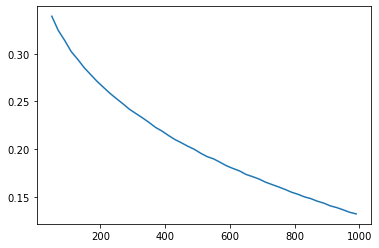

In [109]:
hypertune_kmeans(standardized_X_vectors, min_cluster=50, max_cluster=1000, step=20)

In [110]:
kmeans = KMeans(n_clusters=30, random_state=3).fit_predict(standardized_X_vectors)

In [111]:
with open('model.pkl','wb') as f:
    pickle.dump(kmeans,f)

In [112]:
from collections import Counter
label_counts = Counter(kmeans.labels_)

In [113]:
def pick_samples_of_label(docs, doc_vecs, centroids, labels, of_label, sample=10, top=10):
    # pick docs that are closest to of_label, sampling `sample` amount
    # and picking the `top` ones
    label_idxs = np.equal(labels, of_label).nonzero()[0]
    label_vecs = doc_vecs[label_idxs]
    dists = np.linalg.norm(label_vecs - centroids[of_label], axis=1)
    assert len(label_vecs) == len(label_idxs), f"Lengths must be same, but {len(label_vecs)} != {len(label_idxs)}"
    dists_idx = list(zip(dists, label_idxs))
    sorted_dists = sorted(dists_idx, key = lambda x: x[0])
    
    return [idx for _, idx in sorted_dists]

In [114]:
labels = kmeans.labels_
centroids = kmeans.cluster_centers_

In [115]:
# plot distance between centroids
centroid_dists = []
for centroidi in centroids:
    tmp = [] 
    for centroidj in centroids:
        tmp.append(np.linalg.norm(centroidj - centroidi))
    centroid_dists.append(tmp)
centroid_dists = np.array(centroid_dists)

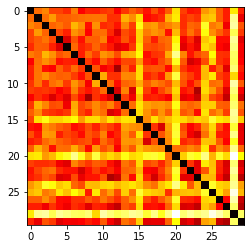

In [116]:
plt.imshow(centroid_dists, cmap='hot', interpolation='nearest')

In [117]:
from collections import Counter
import matplotlib.pyplot as plt

<BarContainer object of 30 artists>

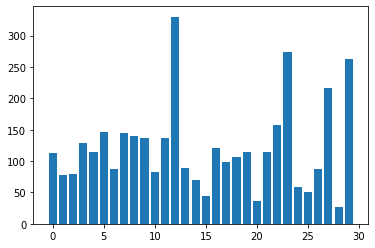

In [118]:
label_counts = Counter(labels)
plt.bar(label_counts.keys(), label_counts.values())

In [119]:
print('number of documents: {}'.format(len(documents)))
print('number of labels: {}'.format(len(labels)))
doc_len_by_labels = {}
for i, doc in enumerate(documents):
    label = labels[i]
    doc_len = len(documents[i].words)
    
    doc_len_by_labels.setdefault(label, [])
    doc_len_by_labels[label].append(doc_len)
    
plot_data = {label: np.mean(docs_len) for label, docs_len in doc_len_by_labels.items()}

number of documents: 3642
number of labels: 3642


<BarContainer object of 30 artists>

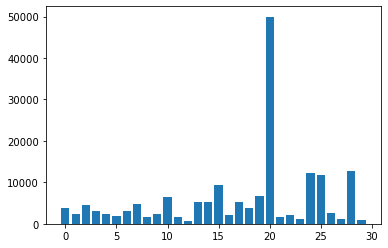

In [120]:
plt.bar(plot_data.keys(), plot_data.values())

In [121]:
standardized_X_vectors[0]

array([0.6366862 , 0.5994753 , 0.544996  , 0.38799465, 0.4494671 ,
       0.20616683, 0.57072014, 0.3303445 , 0.4721222 , 0.6402339 ,
       0.56210166, 0.46484542, 0.4850363 , 0.4781201 , 0.4967491 ,
       0.35873252, 0.55306554, 0.46317562, 0.6137109 , 0.43046996,
       0.3002209 , 0.62559646, 0.78366613, 0.36836696, 0.6959916 ,
       0.6718329 , 0.529319  , 0.4924992 , 0.42278862, 0.5072553 ,
       0.44560325, 0.36521992, 0.45796978, 0.60752296, 0.80628717,
       0.28854904, 0.43755487, 0.60391885, 0.38730204, 0.55075496,
       0.4741343 , 0.61085737, 0.6430843 , 0.48734218, 0.65586424,
       0.57286537, 0.17005068, 0.53912383, 0.40880364, 0.7211175 ],
      dtype=float32)

In [135]:
top = pick_samples_of_label(docs, standardized_X_vectors, centroids, labels, 1)

top = pick_samples_of_label(docs, X_vectors, centroids, labels, 8)

In [136]:
for i in top[:20]:
  try:
    print("post {}".format(i))
    print('.'.join(docs[i]['paragraphs'][:10]))
    print("")
  except:
    pass

post 2442
A Long March 2F rocket lifted off from the Jiuquan Satellite Launch Center in the Gobi Desert Aug. 4, sending a “reusable test space” into low Earth orbit, Chinese language state media Xinhua reported..
.Xinhua confirmed the successful launch around three hours after the 12:00 p.m. Eastern opening of a launch window, indicated by airspace closure notices issued days earlier. . SN_content_ad_728x90 ..
.The terse report stated that the test spacecraft will “operate in orbit for a period of time” before returning to its intended landing site in China. Technical verification of reusable and in-orbit services will be carried out as planned to provide technical support for the peaceful use of space, according to a machine translation of the report..
.U.S. Space Force’s 18th Space Defense Squadron (18 SDS) later tracked the spacecraft in 346 by 593 kilometer orbit inclined by 50 degrees..


post 1281

                U.S. Space Shuttle Commander Terrence Wilcutt (right) and Mir Comm

In [137]:
keywords = ['A Long March 2F rocket lifted off from the Jiuquan Satellite Launch Center in the Gobi Desert Aug. 4, sending a “reusable test space” into low Earth orbit, Chinese language state media Xinhua reported...Xinhua confirmed the successful launch around three hours after the 12:00 p.m. Eastern opening of a launch window, indicated by airspace closure notices issued days earlier. . SN_content_ad_728x90 ...The terse report stated that the test spacecraft will “operate in orbit for a period of time” before returning to its intended landing site in China. Technical verification of reusable and in-orbit services will be carried out as planned to provide technical support for the peaceful use of space, according to a machine translation of the report']
pgraph_pipeline = DataPipeline()
pgraph_pipeline.register_postprocessor(GenSimProcessor('pgraph_gensim_processor'), 30)
pgraph_pipeline.register_postprocessor(FlattenProcessor('pgraph_flatten_processor'), 60)
pgraph_pipeline.register_postprocessor(WordCountLimitProcessor('pgraph_word_limit_processor', 1), 70)

# keywords = ['system', 'programming language']
word_vec = pgraph_pipeline.transform(keywords)

print('word_vec: ', word_vec)
feature_vec = model.infer_vector(word_vec, epochs=50, alpha=0.025)
print('feature_vec: ', feature_vec)

standardized_feature_vec = scaler.transform(feature_vec.reshape(1, -1))

doc_label = kmeans.predict(standardized_feature_vec)[0]
print('doc_label: ', doc_label)

word_vec:  ['long', 'march', 'rocket', 'lifted', 'off', 'from', 'the', 'jiuquan', 'satellite', 'launch', 'center', 'in', 'the', 'gobi', 'desert', 'aug', 'sending', 'reusable', 'test', 'space', 'into', 'low', 'earth', 'orbit', 'chinese', 'language', 'state', 'media', 'xinhua', 'reported', 'xinhua', 'confirmed', 'the', 'successful', 'launch', 'around', 'three', 'hours', 'after', 'the', 'eastern', 'opening', 'of', 'launch', 'window', 'indicated', 'by', 'airspace', 'closure', 'notices', 'issued', 'days', 'earlier', 'sn_content_ad_', 'the', 'terse', 'report', 'stated', 'that', 'the', 'test', 'spacecraft', 'will', 'operate', 'in', 'orbit', 'for', 'period', 'of', 'time', 'before', 'returning', 'to', 'its', 'intended', 'landing', 'site', 'in', 'china', 'technical', 'verification', 'of', 'reusable', 'and', 'in', 'orbit', 'services', 'will', 'be', 'carried', 'out', 'as', 'planned', 'to', 'provide', 'technical', 'support', 'for', 'the', 'peaceful', 'use', 'of', 'space', 'according', 'to', 'machin

In [125]:
for i, label in enumerate(labels):
    docs[i]['label'] = label.item()
# save docs to DB with labels
db['filtered_hn_sites'].drop()
collection = db['filtered_hn_sites']
collection.insert_many(docs)

In [126]:
from sklearn.decomposition import PCA

In [127]:
pca = PCA(n_components=2)
X_transformed = pca.fit_transform(X_vectors)

In [128]:
import matplotlib.pyplot as plt

In [129]:
from matplotlib.pyplot import figure

In [130]:
figure(figsize=(24, 20), dpi=80)

<Figure size 1920x1600 with 0 Axes>

<Figure size 1920x1600 with 0 Axes>

No handles with labels found to put in legend.


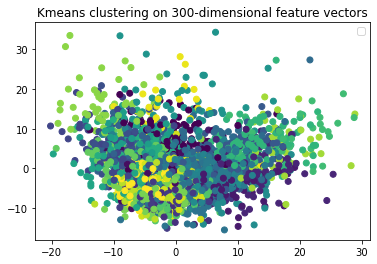

In [131]:
plt.scatter(X_transformed[:,0], X_transformed[:, 1], c=kmeans.labels_)
plt.title("Kmeans clustering on 300-dimensional feature vectors")
plt.legend()
plt.show()

In [93]:
kmeans.labels_

array([24,  1,  3, ...,  0,  9, 26], dtype=int32)